__Basic Imports including Dataframes__

In [14]:
#basic imports

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import shap
from statistics import mean, stdev
import seaborn as sns
from statannot import add_stat_annotation
from matplotlib.patches import Patch
from dna_features_viewer import GraphicFeature, GraphicRecord

#dataframe imports

model_proteins = pd.read_csv('austin_db/model_proteins_final.csv')
model_region = pd.read_csv('austin_db/model_regions_final.csv')
model_peptides = pd.read_csv('austin_db/model_peptides_final.csv')
kathi_features = pd.read_csv('austin_db/df_features(1).csv')
atlas_proteins = pd.read_csv('austin_db/proteinatlas.tsv', sep = '\t')

In [15]:
#combining dataframes
model_proteins = model_proteins.rename(columns={'Protein_Sequence':'Sequence'})
new_features_df = pd.merge(model_proteins, kathi_features, on='Sequence')

In [16]:
#housekeeping

new_features_df['Phosphorylation'].loc[new_features_df['Phosphorylation'] != 0] = 1
new_features_df['Acetylation'].loc[new_features_df['Acetylation'] != 0] = 1
new_features_df['Methylation'].loc[new_features_df['Methylation'] != 0] = 1
new_features_df['Phosphorylation'].loc[new_features_df['Phosphorylation'] != 0] = 1


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [17]:
#making it only kathi's features with classifications and protein id

only_kathi_features_df = new_features_df.drop(['Acetylation','Methylation','Glycosylation','Phosphorylation'], axis=1)
only_kathi_features_df = only_kathi_features_df.drop(['Ubiquitination','Cleavage','Beta','Helix','Binding','Disordered','Turn','Polar','Helical','Basic','Cytoplasmic','Extracellular_x','Coiled','Initiator_Methionine','Transmembrane','Signal_Peptide','Signal_Mitochrondrion','Anchor','GPI','Isoforms','Disulfide','A_x','R_x','N_x','D_x','C_x','Q_x','E_x','G_x','H_x','I_x','L_x','K_x','M_x','F_x','P_x','S_x','T_x','W_x','Y_x','V_x','O','U','B','Z','J','X','MZ','Charge','Weight','Hydrophobicity','Hydrophobic_Moment','Instability','Structure'],axis=1)
only_kathi_features_df = only_kathi_features_df.drop(['Coverage','Sequence','Number_Peptides','Overlapping_Peptides','Mean_Peptide_Length','Protein_Length','Seqdict'], axis=1)      

In [18]:
# Using replace to clarify terminology. Negative = Not Secreted. Positive = Fully Secreted. Mixed = Mixed.
only_kathi_features_df.replace('Positive','Fully_Secreted',inplace=True)
only_kathi_features_df.replace('Negative','Not_Secreted',inplace=True)
only_kathi_features_df.replace('Mixed','Partially_Secreted',inplace=True)

In [13]:
#Exporting whole dataframe so that all protein's Uniprot ID's can be evaluated using Interpro API.

only_kathi_features_df.to_csv('all_proteins_kathi.csv', index=False)

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5347 samples in 0.000s...
[t-SNE] Computed neighbors for 5347 samples in 0.498s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5347
[t-SNE] Computed conditional probabilities for sample 2000 / 5347
[t-SNE] Computed conditional probabilities for sample 3000 / 5347
[t-SNE] Computed conditional probabilities for sample 4000 / 5347
[t-SNE] Computed conditional probabilities for sample 5000 / 5347
[t-SNE] Computed conditional probabilities for sample 5347 / 5347
[t-SNE] Mean sigma: 1.880403
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.371780
[t-SNE] KL divergence after 3000 iterations: 1.528786


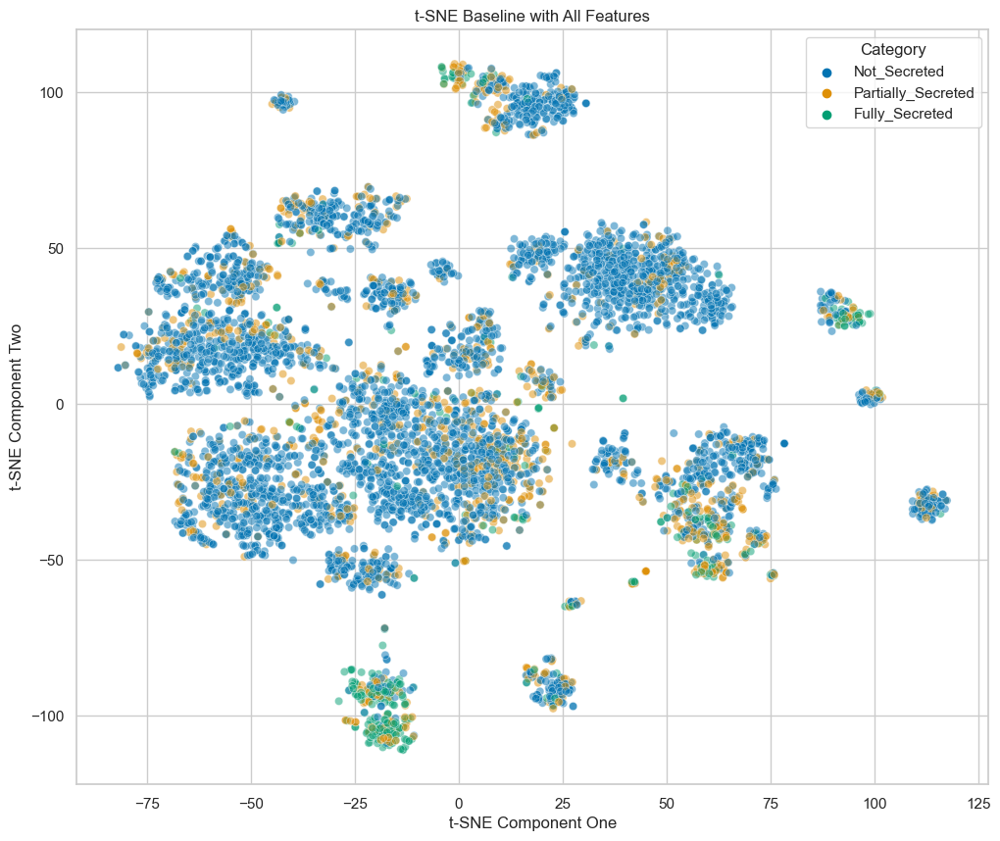

In [19]:
#TSNE with Kathi's Features on the Filtered Classification Level.

from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

features = only_kathi_features_df.drop(['CSF', 'Uniprot','Protein','Classification','Filtered_Classification','Region_Classification'], axis=1)
labels = only_kathi_features_df['Filtered_Classification']
features_scaled = StandardScaler().fit_transform(features)

tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=3000,random_state=42)
tsne_results = tsne.fit_transform(features_scaled)

tsne_df = pd.DataFrame(tsne_results, columns=['tsne-2d-one', 'tsne-2d-two'])
tsne_df['Category'] = labels

# Plot the results
sns.set(style="whitegrid")
plt.figure(figsize=(12, 10))
sns.scatterplot(
    data=tsne_df,
    x='tsne-2d-one', y='tsne-2d-two',
    hue='Category',
    palette='colorblind',  # Choose a color palette
    alpha = 0.5
)

# Set labels and title
plt.xlabel('t-SNE Component One')
plt.ylabel('t-SNE Component Two')
plt.title('t-SNE Baseline with All Features')

plt.show()

__Some Important Feature Visualizations including two Clickable TSNEs for manual exploration__

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5347 samples in 0.000s...
[t-SNE] Computed neighbors for 5347 samples in 0.477s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5347
[t-SNE] Computed conditional probabilities for sample 2000 / 5347
[t-SNE] Computed conditional probabilities for sample 3000 / 5347
[t-SNE] Computed conditional probabilities for sample 4000 / 5347
[t-SNE] Computed conditional probabilities for sample 5000 / 5347
[t-SNE] Computed conditional probabilities for sample 5347 / 5347
[t-SNE] Mean sigma: 1.880403
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.371780
[t-SNE] KL divergence after 3000 iterations: 1.528786


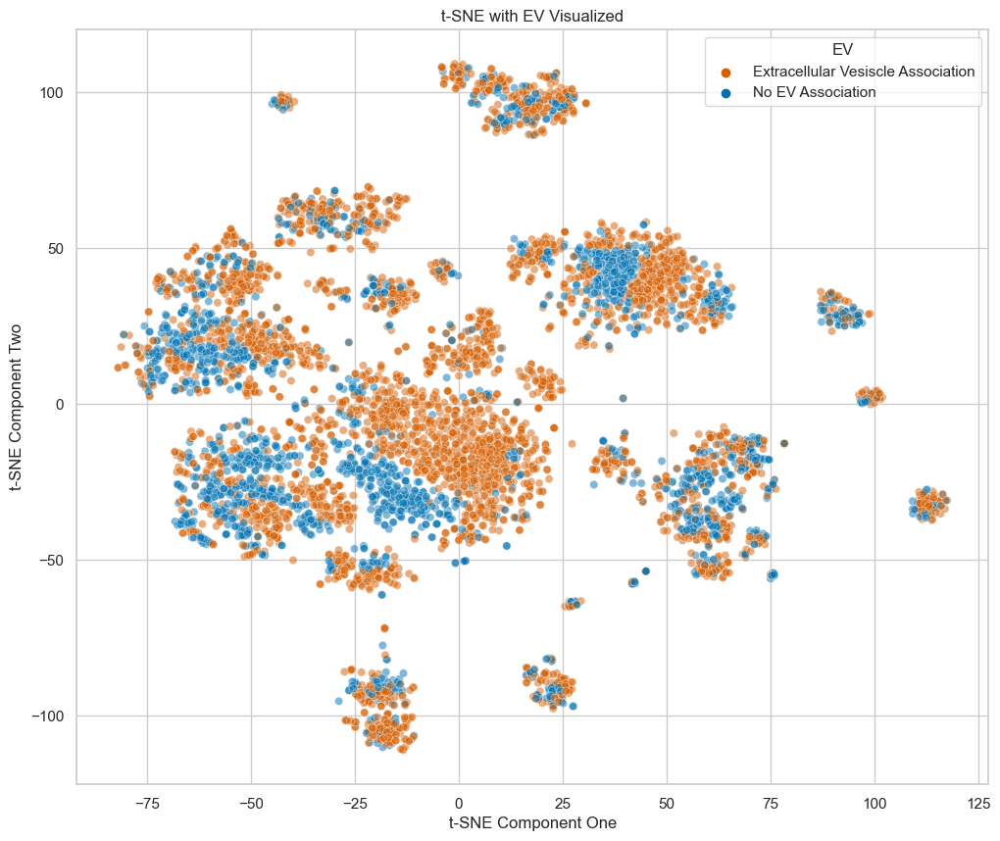

In [20]:
#Predicted Extracellular Vesicle Associations visualized in TSNE

from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

features = only_kathi_features_df.drop(['CSF', 'Uniprot','Protein','Classification','Filtered_Classification','Region_Classification'], axis=1)
labels = only_kathi_features_df['EV']
features_scaled = StandardScaler().fit_transform(features)

tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=3000,random_state=42)
tsne_results = tsne.fit_transform(features_scaled)

tsne_df = pd.DataFrame(tsne_results, columns=['tsne-2d-one', 'tsne-2d-two'])
tsne_df['Category'] = labels

tsne_df['EV'] = np.where(tsne_df['Category'] == 1, 'Extracellular Vesiscle Association', 'No EV Association')

# Define color mapping
colors = {'Extracellular Vesiscle Association': '#D55E00', 'No EV Association': '#0072B2'}

# Plot the results
sns.set(style="whitegrid")
plt.figure(figsize=(12, 10))
sns.scatterplot(
    data=tsne_df,
    x='tsne-2d-one', y='tsne-2d-two',
    hue='EV',
    palette=colors,  # Choose a color palette
    alpha = 0.5
)

# Set labels and title
plt.xlabel('t-SNE Component One')
plt.ylabel('t-SNE Component Two')
plt.title('t-SNE with EV Visualized')

plt.show()

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5347 samples in 0.001s...
[t-SNE] Computed neighbors for 5347 samples in 0.505s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5347
[t-SNE] Computed conditional probabilities for sample 2000 / 5347
[t-SNE] Computed conditional probabilities for sample 3000 / 5347
[t-SNE] Computed conditional probabilities for sample 4000 / 5347
[t-SNE] Computed conditional probabilities for sample 5000 / 5347
[t-SNE] Computed conditional probabilities for sample 5347 / 5347
[t-SNE] Mean sigma: 1.880403
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.371780
[t-SNE] KL divergence after 3000 iterations: 1.528786


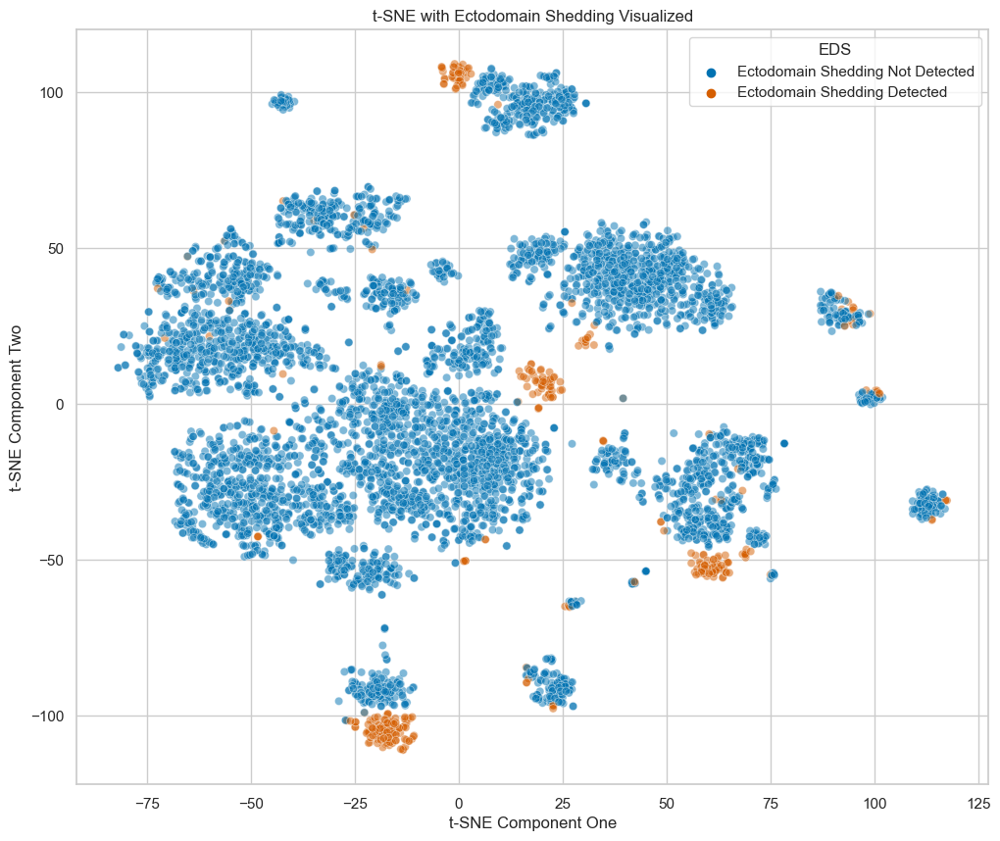

In [21]:
#Predicted Ectodomain Shedding Region visualized in TSNE

from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

features = only_kathi_features_df.drop(['CSF', 'Uniprot','Protein','Classification','Filtered_Classification','Region_Classification'], axis=1)
labels = only_kathi_features_df['Ectodomain_shedding']
features_scaled = StandardScaler().fit_transform(features)

tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=3000,random_state=42)
tsne_results = tsne.fit_transform(features_scaled)

tsne_df = pd.DataFrame(tsne_results, columns=['tsne-2d-one', 'tsne-2d-two'])
tsne_df['Category'] = labels

tsne_df['EDS'] = np.where(tsne_df['Category'] == 1, 'Ectodomain Shedding Detected', 'Ectodomain Shedding Not Detected')

# Define color mapping
colors = {'Ectodomain Shedding Detected': '#D55E00', 'Ectodomain Shedding Not Detected': '#0072B2'}

# Plot the results
sns.set(style="whitegrid")
plt.figure(figsize=(12, 10))
sns.scatterplot(
    data=tsne_df,
    x='tsne-2d-one', y='tsne-2d-two',
    hue='EDS',
    palette=colors,  # Choose a color palette
    alpha = 0.5
)

# Set labels and title
plt.xlabel('t-SNE Component One')
plt.ylabel('t-SNE Component Two')
plt.title('t-SNE with Ectodomain Shedding Visualized')

plt.show()

In [22]:
#concatinating TSNE_DF to Kathi's DF to create a clickable TSNE.

kathi_tsne_df = pd.concat([only_kathi_features_df, tsne_df], axis=1)
clickable_df = pd.merge(kathi_tsne_df, atlas_proteins, on='Uniprot')

In [23]:
import plotly.express as px

fig = px.scatter(clickable_df, x='tsne-2d-one', y='tsne-2d-two', color='Category', hover_data = ['Protein class','Uniprot','Signal peptide', 'EV', 'L_y','H_y','C_y','Isoelectric point', 'Sheet_NSP', 'K_y', 'R_y', 'Helix_NSP','Extracellular_y','D_y','Ectodomain_shedding','G_y','Length','Biological process'])

# Show the interactive plot
fig.show()

In [24]:
#another interactive plot, different features this time.

import plotly.express as px

fig = px.scatter(clickable_df, x='tsne-2d-one', y='tsne-2d-two', color='Category', hover_data = ['Protein class','Signal peptide','EV','Ectodomain_shedding','Biological process','Brain expression cluster'])

# Show the interactive plot
fig.show()

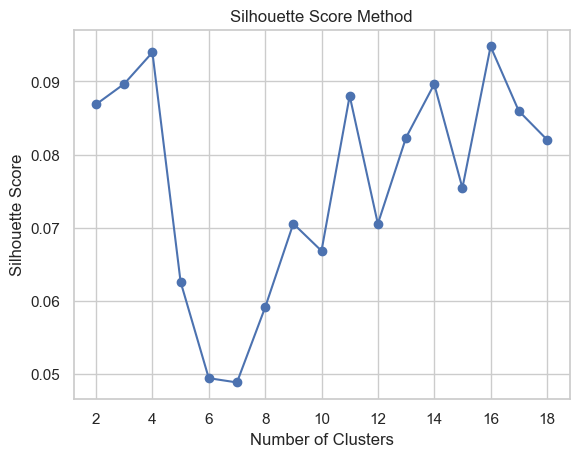

In [43]:
#just checking the silhouette score. nothing of note - performs as bad as expected.

from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

silhouette_scores = []
for i in range(2, 19):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(features_scaled)
    silhouette_scores.append(silhouette_score(features_scaled, kmeans.labels_))

plt.plot(range(2, 19), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score Method')

plt.show()

__Protein Family Explorations__

In [28]:
pfam_families = pd.read_csv('5_Protein_Groupings_TSNE_Explorations/pfam_families.csv')
pfam_domains = pd.read_csv('5_Protein_Groupings_TSNE_Explorations/pfam_domains.csv')

In [29]:
pfam_families

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,family,Unnamed: 5,Unnamed: 6,Uniprot,Unnamed: 8
0,PF00083,Sugar (and other) transporter,pfam,family,IPR005828,-,-,A1A5C7,686
1,PF14722,Ki-ras-induced actin-interacting protein-IP3R-...,pfam,family,IPR029325,-,-,A2RU30,521
2,PF01128,2-C-methyl-D-erythritol 4-phosphate cytidylylt...,pfam,family,IPR034683,-,-,A4D126,451
3,PF14753,Protein FAM221A/B,pfam,family,IPR026755,-,-,A4D161,298
4,PF01926,50S ribosome-binding GTPase,pfam,family,IPR006073,-,-,A4D1E9,387
...,...,...,...,...,...,...,...,...,...
2678,PF00781,Diacylglycerol kinase catalytic domain,pfam,family,IPR001206,-,-,Q9Y6T7,804
2679,PF02205,WH2 motif,pfam,family,IPR003124,-,-,Q9Y6W5,498
2680,PF01663,Type I phosphodiesterase / nucleotide pyrophos...,pfam,family,IPR002591,-,-,Q9Y6X5,453
2681,PF02825,WWE domain,pfam,family,IPR004170,-,-,Q9Y6Y8,1000


In [30]:
# Count occurrences of each unique value in the 'family' column
family_counts = pfam_families['family'].value_counts()

# Filter to include only values that occur more than once
family_counts = family_counts[family_counts > 1]

# Display the result
print("Categorical variables that occur more than once:")
print(family_counts)

Categorical variables that occur more than once:
-            75
IPR006059    21
IPR005821    20
IPR000195    19
IPR001394    19
             ..
IPR000326     2
IPR006024     2
IPR000885     2
IPR025969     2
IPR004274     2
Name: family, Length: 462, dtype: int64


In [33]:
# Create a DataFrame from the counts
family_counts_df = pd.DataFrame({'family': family_counts.index, 'count': family_counts})

# Merge with the original DataFrame to get additional information
uniprot_family_df = pd.merge(pfam_families, family_counts_df, on='family', how='inner')

In [34]:
uniprot_family_df

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,family,Unnamed: 5,Unnamed: 6,Uniprot,Unnamed: 8,count
0,PF00083,Sugar (and other) transporter,pfam,family,IPR005828,-,-,A1A5C7,686,13
1,PF00083,Sugar (and other) transporter,pfam,family,IPR005828,-,-,A1A5C7,686,13
2,PF00083,Sugar (and other) transporter,pfam,family,IPR005828,-,-,A1A5C7,686,13
3,PF00083,Sugar (and other) transporter,pfam,family,IPR005828,-,-,A1A5C7,686,13
4,PF00083,Sugar (and other) transporter,pfam,family,IPR005828,-,-,P11166,492,13
...,...,...,...,...,...,...,...,...,...,...
1858,PF15974,"Cadherin C-terminal cytoplasmic tail, catenin-...",pfam,family,IPR031904,-,-,Q9Y5I4,1007,3
1859,PF06480,FtsH Extracellular,pfam,family,IPR011546,-,-,Q9UQ90,795,2
1860,PF06480,FtsH Extracellular,pfam,family,IPR011546,-,-,Q9Y4W6,797,2
1861,PF04099,Sybindin-like family,pfam,family,IPR007233,-,-,Q9Y296,219,2


In [35]:
#concatinating TSNE_df with the families information

austin_tsne_df = pd.concat([only_kathi_features_df, tsne_df], axis=1)
clickable_df = pd.merge(austin_tsne_df, uniprot_family_df, on='Uniprot')

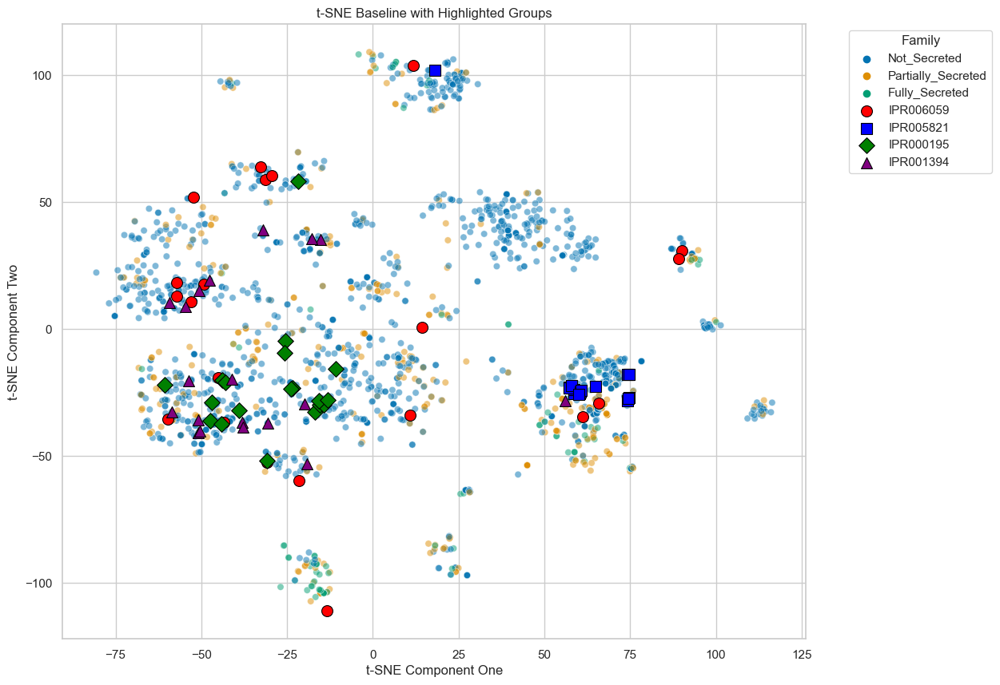

In [44]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Plot the results
sns.set(style="whitegrid")
plt.figure(figsize=(12, 10))

# Plot all points with reduced alpha
sns.scatterplot(
    data=clickable_df,
    x='tsne-2d-one', y='tsne-2d-two',
    hue='Filtered_Classification',
    palette='colorblind',
    alpha=0.5
)

# Highlight specific groups
highlight_groups = ['IPR006059', 'IPR005821', 'IPR000195', 'IPR001394']
colors = ['red', 'blue', 'green', 'purple']
markers = ['o', 's', 'D', '^']

for group, color, marker in zip(highlight_groups, colors, markers):
    subset = clickable_df[clickable_df['family'] == group]
    sns.scatterplot(
        data=subset,
        x='tsne-2d-one', y='tsne-2d-two',
        label=group,
        color=color,
        marker=marker,
        s=100,  # Marker size
        edgecolor='black'
    )

# Set labels and title
plt.xlabel('t-SNE Component One')
plt.ylabel('t-SNE Component Two')
plt.title('t-SNE Baseline with Highlighted Groups')

# Show legend
plt.legend(title='Family', bbox_to_anchor=(1.05, 1), loc='upper left')

#Saving the Figure
plt.savefig('final_figures/TSNE_All_Features_Baseline_with_Families.png',dpi=300, bbox_inches = "tight")

# Display the plot
plt.show()


In [46]:
#Clickable DF for exploration
fig = px.scatter(clickable_df, x='tsne-2d-one', y='tsne-2d-two', color='Filtered_Classification', hover_data = ['Uniprot', 'family', 'Filtered_Classification', 'Region_Classification','Classification'])
# Show the interactive plot
fig.show()

In [9]:
#below begins the long descent into peptide analysis

model_peptides

,Peptide_Sequence,Sequence_Length,Protein,Brain,CSF,Author,Detectability,Detection_Probability,Protein_Sequence,Protein_Length,...,Basic and acidic residues,Polar residues,Binding site,Coiled coil,Cytoplasmic,Lumenal,Extracellular,Transit peptide,Transmembrane,Alternative sequence
0,AAAAAAAAAAAAAAAGAGAGAK,22.0,P55011,True,Brain + CSF,"Faigle, Rydbirk, Duong",0.0,0.122071,MEPRPTAPSSGAPGLAGVGETPSAAALAAARVELPGTAVPSVPEDA...,1212.0,...,0,0,0,0,1,0,0,0,0,0
1,AAAAAAAAAAAPPAPPEGASPGDSAR,26.0,Q8WXD9,True,Brain Only,"Faigle, Rydbirk, Duong",1.0,0.581326,MGKEQELVQAVKAEDVGTAQRLLQRPRPGKAKLLGSTKKINVNFQD...,1431.0,...,1,1,0,0,0,0,0,0,0,0
2,AAAAAAAAAPAAAATAPTTAATTAATAAQ,29.0,P37108,True,Brain Only,"Rydbirk, Duong",1.0,0.807786,MVLLESEQFLTELTRLFQKCRTSGSVYITLKKYDGRTKPIPKKGTV...,136.0,...,0,0,0,0,0,0,0,0,0,0
3,AAAAAAAAVPSAGPAGPAPTSAAGR,25.0,Q9Y4H2,True,Brain + CSF,"Faigle, Duong",1.0,0.501463,MASPPRHGPPGPASGDGPNLNNNNNNNNHSVRKCGYLRKQKHGHKR...,1338.0,...,0,1,0,0,0,0,0,0,0,0
4,AAAAAAALQAK,11.0,P36578,True,Brain + CSF,"Faigle, Rydbirk, Duong",1.0,0.673549,MACARPLISVYSEKGESSGKNVTLPAVFKAPIRPDIVNFVHTNLRK...,427.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70187,YYQTIGNHASYYK,13.0,Q9UNM6,True,Brain Only,"Faigle, Rydbirk",1.0,0.684231,MKDVPGFLQQSQNSGPGQPAVWHRLEELYTKKLWHQLTLQVLDFVQ...,376.0,...,0,0,0,0,0,0,0,0,0,0
70188,YYRPTEVDFLQGDCTK,16.0,O60547,True,Brain Only,"Rydbirk, Duong",1.0,0.785365,MAHAPARCPSARGSGDGEMGKPRNVALITGITGQDGSYLAEFLLEK...,372.0,...,0,0,1,0,0,0,0,0,0,0
70189,YYSDIGK,7.0,Q9HCM2,True,Brain Only,"Faigle, Rydbirk, Duong",1.0,0.780594,MKAMPWNWTCLLSHLLMVGMGSSTLLTRQPAPLSQKQRSFVTFRGE...,1894.0,...,0,0,0,0,1,0,0,0,1,1
70190,YYSDLFSYCDIESTK,15.0,Q96D71,True,Brain Only,"Rydbirk, Duong",1.0,0.740213,MEGLTLSDAEQKYYSDLFSYCDIESTKKVVVNGRVLELFRAAQLPN...,796.0,...,0,0,0,0,0,0,0,0,0,0


In [47]:
print(clickable_df[clickable_df['family'] == 'IPR005821'])

     Protein      Classification Filtered_Classification  \
138   O43525        Not_Secreted            Not_Secreted   
141   O43526        Not_Secreted            Not_Secreted   
180   O60741  Partially_Secreted      Partially_Secreted   
265   O95259        Not_Secreted            Not_Secreted   
417   P16389        Not_Secreted            Not_Secreted   
428   P17658        Not_Secreted            Not_Secreted   
467   P22001        Not_Secreted            Not_Secreted   
471   P22459        Not_Secreted            Not_Secreted   
542   P35498        Not_Secreted            Not_Secreted   
616   P48547        Not_Secreted            Not_Secreted   
831   Q09470        Not_Secreted            Not_Secreted   
844   Q12791        Not_Secreted            Not_Secreted   
916   Q14721        Not_Secreted            Not_Secreted   
1395  Q96PR1        Not_Secreted            Not_Secreted   
1410  Q99250  Partially_Secreted      Partially_Secreted   
1644  Q9NZV8        Not_Secreted        

In [10]:
model_peptides.columns.tolist()

['Peptide_Sequence',
 'Sequence_Length',
 'Protein',
 'Brain',
 'CSF',
 'Author',
 'Detectability',
 'Detection_Probability',
 'Protein_Sequence',
 'Protein_Length',
 'Position_in_Protein',
 'Protein_Classification',
 'Region_Classification',
 'Filtered_Classification',
 'A',
 'R',
 'N',
 'D',
 'C',
 'Q',
 'E',
 'G',
 'H',
 'I',
 'L',
 'K',
 'M',
 'F',
 'P',
 'S',
 'T',
 'W',
 'Y',
 'V',
 'O',
 'U',
 'B',
 'Z',
 'J',
 'X',
 'MZ',
 'Charge',
 'Weight',
 'Hydrophobicity',
 'Hydrophobic_Moment',
 'Instability',
 'Structure',
 'Features',
 'Signal',
 'Glycosylation',
 'Phosphorylation',
 'Acetylation',
 'Methylation',
 'Ubiquitination',
 'Succinylation',
 'Hydroxylation',
 'Palmitoylation',
 'Disordered',
 'Disulfide bond',
 'Helix',
 'Beta strand',
 'Turn',
 'Basic and acidic residues',
 'Polar residues',
 'Binding site',
 'Coiled coil',
 'Cytoplasmic',
 'Lumenal',
 'Extracellular',
 'Transit peptide',
 'Transmembrane',
 'Alternative sequence']

In [12]:
model_peptides['Filtered_Classification'].unique()

array(['Mixed', 'Negative', 'Positive'], dtype=object)

In [13]:
model_peptides['coverage'] = model_peptides['Sequence_Length'] / model_peptides['Protein_Length']

In [14]:
model_peptides['coverage']

0        0.018152
1        0.018169
2        0.213235
3        0.018685
4        0.025761
           ...   
70187    0.034574
70188    0.043011
70189    0.003696
70190    0.018844
70191    0.014706
Name: coverage, Length: 70192, dtype: float64

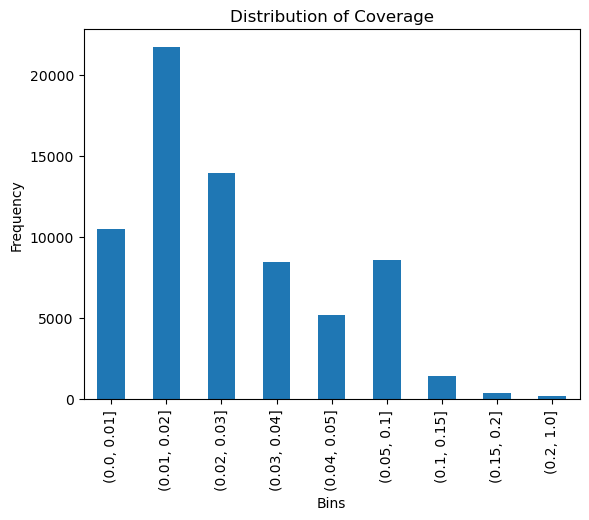

In [16]:
# making a coverage histogram
bins = [0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.1, 0.15, 0.2, 1.0]

# Cut the data into bins and count the occurrences in each bin
bin_counts = pd.cut(model_peptides['coverage'], bins=bins).value_counts().sort_index()

# Plot the histogram
bin_counts.plot(kind='bar')

# Add labels and title
plt.title('Distribution of Coverage')
plt.xlabel('Bins')
plt.ylabel('Frequency')

# Show the plot
plt.show()

In [1]:
partial_sec_incorrect = pd.read_csv('austin_db/partial_sec_incorrect.csv')

NameError: name 'pd' is not defined